In [1]:
#IMPORTING LIBRARIES

import pandas  as pd

import numpy as np

#import data visualization libraries
import seaborn as sns

import matplotlib.pyplot as plt
%matplotlib inline

import plotly.plotly as py
import plotly.graph_objs as go
# For offline use
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import cufflinks as cf
# For offline use
cf.go_offline()

# For Notebooks
init_notebook_mode(connected=True)

In [2]:
#Lets set to show max columns in dataset
pd.options.display.max_columns=30

df = pd.read_csv('minishoesdata.csv')
df.head()

,Fecha,Duración media de la sesión,Búsquedas orgánicas,Rebotes,Salidas,Usuarios nuevos,Sesiones,Valor medio de pedido,Tasa de conversión de comercio electrónico,Número de unidades agregadas al carrito,Valor por sesión,Número de veces que el producto que ha retirado del carrito,Transacciones,Porcentaje compra/detalle,Porcentaje carrito/detalle,Ingresos,CTR de la lista de productos,Clics de la lista de productos,Sesiones con búsquedas,Sesiones con evento,Número de pagos de productos,Páginas/sesión,Cantidad,Compras Redsys,Compras Paypal
0,20171124,0:02:19,749,879,6565,4017,6616,"31,61","1,96",1074,"0,62",387,130,"3,00","16,03","4.108,90","2,14",4729,38,5645,1082,"3,5",209,"231,71","90,24"
1,20171018,0:02:20,746,344,3509,1945,3537,"38,12","1,64",306,"0,63",80,58,"2,79","8,68","2.210,80","2,34",2972,15,3165,309,"3,47",99,"186,67","113,33"
2,20171004,0:02:58,729,371,3900,2656,3935,"44,03","1,83",437,"0,81",127,72,"3,33","10,67","3.170,02","2,35",3984,9,3513,307,"4,29",141,"300,00","118,18"
3,20170918,0:03:01,649,264,2352,1197,2372,"45,77","2,87",406,"1,31",108,68,"4,68","13,33","3.112,26","2,13",2044,9,2073,587,"3,89",140,"223,08","100,00"
4,20170919,0:02:44,631,224,1961,1075,1977,"42,71","2,68",264,"1,14",87,53,"4,41","11,58","2.263,43","2,27",1565,15,1714,266,"3,69",99,"176,47","76,47"


# DATA PREPARATION AND CLEANING 

In [3]:
#RENAMES COLUMNS
#DICTIONARY

df.rename(columns={'Búsquedas orgánicas':'Visitas'}, inplace=True)
df.rename(columns={'Duración media de la sesión':'DMS'}, inplace=True)
df.rename(columns={'Valor medio de pedido':'VMP'}, inplace=True)
df.rename(columns={'Tasa de conversión de comercio electrónico':'CR'}    , inplace=True)                
df.rename(columns={'Número de unidades agregadas al carrito':'UNC'}, inplace=True)
df.rename(columns={'Valor por sesión':'VS'}, inplace=True)
df.rename(columns={'Número de veces que el producto que ha retirado del carrito':'NVPRC'} , inplace=True)  
df.rename(columns={'Transacciones':'TR'} , inplace=True)
df.rename(columns={'Porcentaje compra/detalle':'PCOD'}, inplace=True)
df.rename(columns={'Porcentaje carrito/detalle':'PCRD'}  , inplace=True)        
df.rename(columns={'CTR de la lista de productos':'CTRLP'} , inplace=True)         
df.rename(columns={'Clics de la lista de productos':'CLP'} , inplace=True)         
df.rename(columns={'Sesiones con búsquedas':'SB'} , inplace=True)         
df.rename(columns={'Sesiones con evento':'SE'}    , inplace=True)      
df.rename(columns={'Número de pagos de productos':'NPP'} , inplace=True)         
df.rename(columns={'Páginas/sesión':'P/S'}   , inplace=True)       
df.rename(columns={'Compras Redsys':'CRED'}, inplace=True)
df.rename(columns={'Compras Paypal':'CPAY'}, inplace=True)

In [4]:
#CONVERTIN TIME COLUMNS INTO SECONDS
#CREATE FUNCTION

def get_sec(time_str):
    h, m, s = time_str.split(':')
    return int(h) * 3600 + int(m) * 60 + int(s)

df['DMS'] = df['DMS'].apply(get_sec)

In [5]:
#FLOAT FUNCTION TO DELETE '0,00\xa0' VALUES FROM RAWS
def fl(x):
    x.split('\ ')
    return x[:-1]

In [6]:
#DELETE '\xa0' VALUES FROM COLUMNS

df['VMP'] = df['VMP'].apply(fl)
df['CR'] = df['CR'].apply(fl)
df['VS'] = df['VS'].apply(fl)
df['PCOD'] = df['PCOD'].apply(fl)
df['PCRD'] = df['PCRD'].apply(fl)
df['Ingresos'] = df['Ingresos'].apply(fl)
df['CTRLP'] = df['CTRLP'].apply(fl)
df['P/S'] = df['P/S'].apply(fl)
df['CRED'] = df['CRED'].apply(fl)
df['CPAY'] = df['CPAY'].apply(fl)

In [7]:
#DROP COLUMNS WONT BE USED IN MODELING

#df.drop(['Fecha','VMP','CPA','VS','PCOD','PCRD','Ingresos','CTRLP','P/S','CRED','CPAY'],axis=1,inplace=True)

In [8]:
df.head()

,Fecha,DMS,Visitas,Rebotes,Salidas,Usuarios nuevos,Sesiones,VMP,CR,UNC,VS,NVPRC,TR,PCOD,PCRD,Ingresos,CTRLP,CLP,SB,SE,NPP,P/S,Cantidad,CRED,CPAY
0,20171124,139,749,879,6565,4017,6616,"31,61","1,96",1074,"0,62",387,130,"3,00","16,03","4.108,90","2,14",4729,38,5645,1082,"3,",209,"231,71","90,24"
1,20171018,140,746,344,3509,1945,3537,"38,12","1,64",306,"0,63",80,58,"2,79","8,68","2.210,80","2,34",2972,15,3165,309,"3,4",99,"186,67","113,33"
2,20171004,178,729,371,3900,2656,3935,"44,03","1,83",437,"0,81",127,72,"3,33","10,67","3.170,02","2,35",3984,9,3513,307,"4,2",141,"300,00","118,18"
3,20170918,181,649,264,2352,1197,2372,"45,77","2,87",406,"1,31",108,68,"4,68","13,33","3.112,26","2,13",2044,9,2073,587,"3,8",140,"223,08","100,00"
4,20170919,164,631,224,1961,1075,1977,"42,71","2,68",264,"1,14",87,53,"4,41","11,58","2.263,43","2,27",1565,15,1714,266,"3,6",99,"176,47","76,47"


In [9]:
#Change ',' to '.', in order to proceed with float64 transformation 

#Functions

def ingresos(x):
    x.split()
    return x[:-3]

def ps(x):
    x.split()
    return x[:1]

def credcpay(x):
    x.split()
    return x[:-3]




In [10]:
df['VMP'] = df['VMP'].str.replace(',','.')
df['CR'] = df['CR'].str.replace(',','.')
df['VS'] = df['VS'].str.replace(',','.')
df['PCOD'] = df['PCOD'].str.replace(',','.')
df['PCRD'] = df['PCRD'].str.replace(',','.')
df['Ingresos'] = df['Ingresos'].apply(ingresos)
df['CTRLP'] = df['CTRLP'].str.replace(',','.')
df['P/S'] = df['P/S'].apply(ps)
df['CRED'] = df['CRED'].apply(credcpay)
df['CPAY'] = df['CPAY'].apply(credcpay)

In [11]:
df.head()

,Fecha,DMS,Visitas,Rebotes,Salidas,Usuarios nuevos,Sesiones,VMP,CR,UNC,VS,NVPRC,TR,PCOD,PCRD,Ingresos,CTRLP,CLP,SB,SE,NPP,P/S,Cantidad,CRED,CPAY
0,20171124,139,749,879,6565,4017,6616,31.61,1.96,1074,0.62,387,130,3.00,16.03,4.108,2.14,4729,38,5645,1082,3,209,231,90
1,20171018,140,746,344,3509,1945,3537,38.12,1.64,306,0.63,80,58,2.79,8.68,2.210,2.34,2972,15,3165,309,3,99,186,113
2,20171004,178,729,371,3900,2656,3935,44.03,1.83,437,0.81,127,72,3.33,10.67,3.170,2.35,3984,9,3513,307,4,141,300,118
3,20170918,181,649,264,2352,1197,2372,45.77,2.87,406,1.31,108,68,4.68,13.33,3.112,2.13,2044,9,2073,587,3,140,223,100
4,20170919,164,631,224,1961,1075,1977,42.71,2.68,264,1.14,87,53,4.41,11.58,2.263,2.27,1565,15,1714,266,3,99,176,76


# DATA NORMALIZATION 

In [12]:
#CONVERT ALL VALUES IN % FORMAT TO FLOAT NUMBERS
def p2f(x):
    return float(x.strip())/100

In [13]:
df['VMP'] = df['VMP'].apply(p2f)


In [14]:
df['CR'] = df['CR'].apply(p2f)


In [15]:
df['VS'] = df['VS'].apply(p2f)


In [16]:
df['PCOD'] = df['PCOD'].apply(p2f)


In [17]:
df['PCRD'] = df['PCRD'].apply(p2f)

In [18]:
df['Ingresos'] = df['Ingresos'].apply(p2f)


In [19]:
df['CTRLP'] = df['CTRLP'].apply(p2f)


In [20]:
#Unconvertable string ???!!!

df.drop('P/S',axis=1,inplace=True)


In [21]:
df['CRED'] = df['CRED'].apply(p2f)


In [22]:
df['CPAY'] = df['CPAY'].apply(p2f)

In [23]:
df.dtypes


Fecha                int64
DMS                  int64
Visitas              int64
Rebotes              int64
Salidas              int64
Usuarios nuevos      int64
Sesiones             int64
VMP                float64
CR                 float64
UNC                  int64
VS                 float64
NVPRC                int64
TR                   int64
PCOD               float64
PCRD               float64
Ingresos           float64
CTRLP              float64
CLP                  int64
SB                   int64
SE                   int64
NPP                  int64
Cantidad             int64
CRED               float64
CPAY               float64
dtype: object

In [24]:
#CREATE NEW CLEAN DATAFRAME FOR DATA NORMALIZATION PROCESS
dfc=df

In [25]:
from sklearn import preprocessing

# Create n, where n the 'dataset'values as floats
n = dfc.values.astype(float)

# Create a minimum and maximum processor object
min_max_scaler = preprocessing.MinMaxScaler()

# Create an object to transform the data to fit minmax processor
n_scaled = min_max_scaler.fit_transform(n)

# Run the normalizer on the dataframe
dfn = pd.DataFrame(n_scaled)

In [26]:
dfn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 737 entries, 0 to 736
Data columns (total 24 columns):
0     737 non-null float64
1     737 non-null float64
2     737 non-null float64
3     737 non-null float64
4     737 non-null float64
5     737 non-null float64
6     737 non-null float64
7     737 non-null float64
8     737 non-null float64
9     737 non-null float64
10    737 non-null float64
11    737 non-null float64
12    737 non-null float64
13    737 non-null float64
14    737 non-null float64
15    737 non-null float64
16    737 non-null float64
17    737 non-null float64
18    737 non-null float64
19    737 non-null float64
20    737 non-null float64
21    737 non-null float64
22    737 non-null float64
23    737 non-null float64
dtypes: float64(24)
memory usage: 138.3 KB


In [27]:
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 737 entries, 0 to 736
Data columns (total 24 columns):
Fecha              737 non-null int64
DMS                737 non-null int64
Visitas            737 non-null int64
Rebotes            737 non-null int64
Salidas            737 non-null int64
Usuarios nuevos    737 non-null int64
Sesiones           737 non-null int64
VMP                737 non-null float64
CR                 737 non-null float64
UNC                737 non-null int64
VS                 737 non-null float64
NVPRC              737 non-null int64
TR                 737 non-null int64
PCOD               737 non-null float64
PCRD               737 non-null float64
Ingresos           737 non-null float64
CTRLP              737 non-null float64
CLP                737 non-null int64
SB                 737 non-null int64
SE                 737 non-null int64
NPP                737 non-null int64
Cantidad           737 non-null int64
CRED               737 non-null float64
CPAY 

In [28]:
dfc.to_csv('minishoes_cleaned.csv', encoding='utf-8', index=False)

In [29]:
dfc.columns

Index(['Fecha', 'DMS', 'Visitas', 'Rebotes', 'Salidas', 'Usuarios nuevos',
       'Sesiones', 'VMP', 'CR', 'UNC', 'VS', 'NVPRC', 'TR', 'PCOD', 'PCRD',
       'Ingresos', 'CTRLP', 'CLP', 'SB', 'SE', 'NPP', 'Cantidad', 'CRED',
       'CPAY'],
      dtype='object')

In [30]:
dfn.columns=['Fecha', 'DMS', 'Busquedas', 'Rebotes', 'Salidas', 'Usuarios nuevos',
       'Sesiones', 'VMP', 'CR', 'UNC', 'VS', 'NVPRC', 'TR', 'PCOD', 'PCRD',
       'Ingresos', 'CTRLP', 'CLP', 'SB', 'SE', 'NPP', 'Cantidad', 'CRED',
       'CPAY']

In [31]:
#The date column wont use in modeling
dfc.drop('Fecha', axis=1,inplace=True)
dfn.drop('Fecha', axis=1, inplace=True)

In [32]:
dfc.iplot(kind='box')

In [33]:
dfn.iplot(kind='box')

# Data Exploration

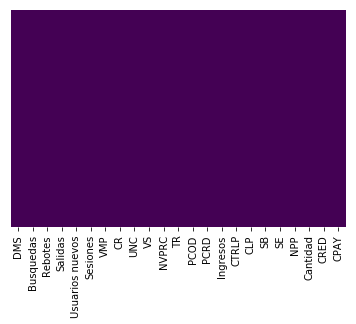

In [34]:
#CHECK FOR NULL VALUES
sns.heatmap(dfn.isnull(),yticklabels=False,cbar=False,cmap='viridis')

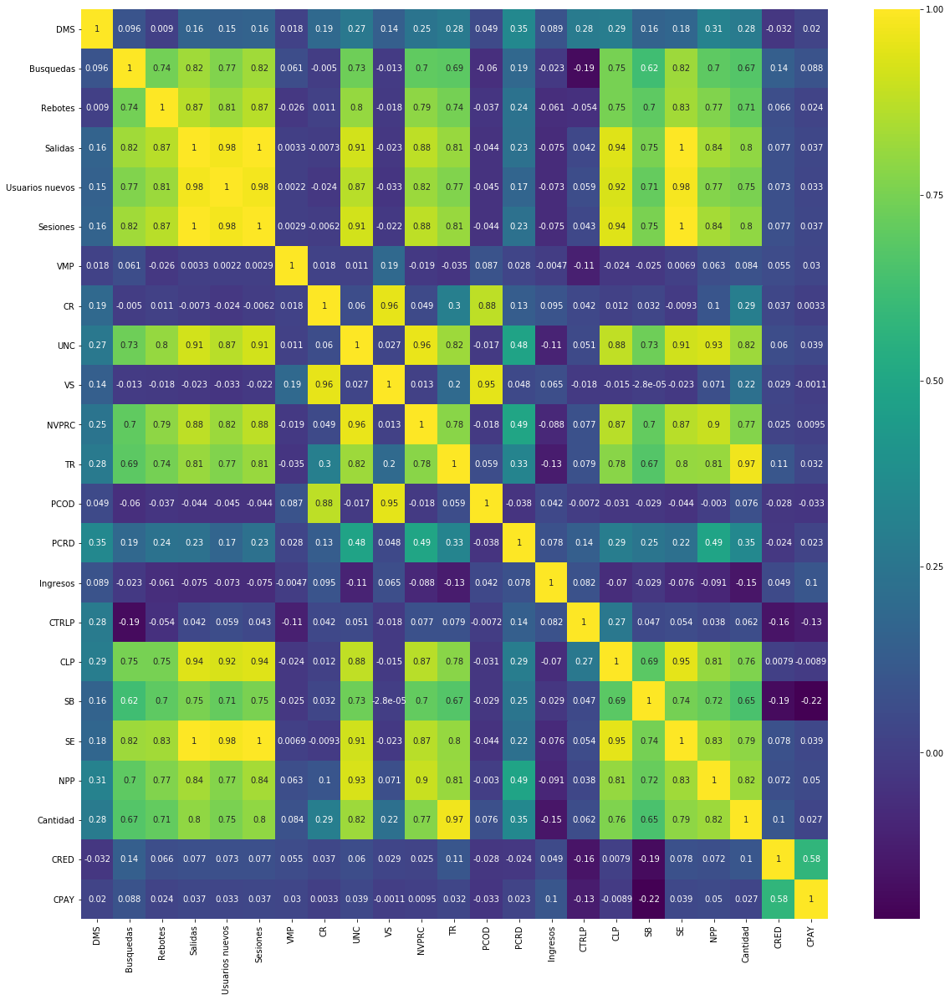

In [35]:
plt.figure(figsize=(20,20))
sns.heatmap(dfn.corr(), cmap='viridis', annot=True)

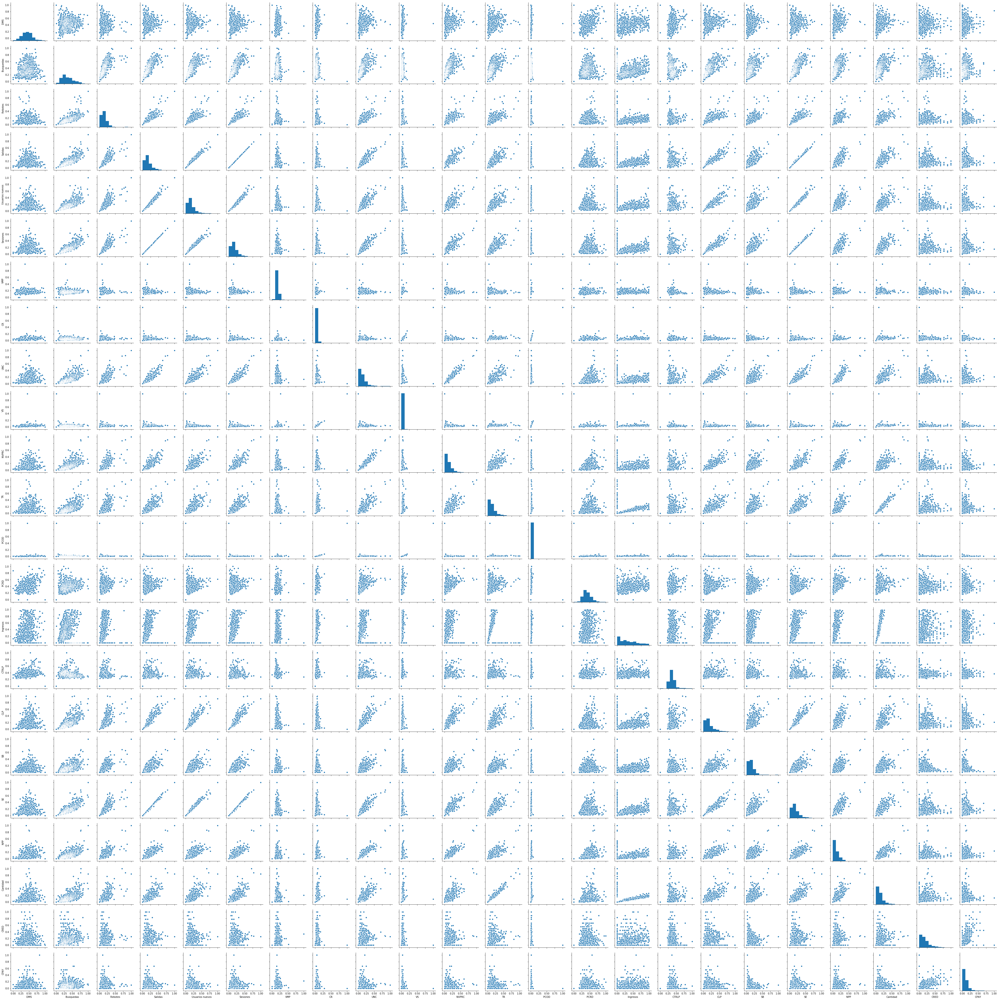

In [36]:
plt.figure(figsize=(200,200))
sns.pairplot(dfn)

# Modeling 

In [37]:
X = dfc.drop(['TR'], axis=1)
y = dfc['TR']

In [38]:
# Lets split our dataset on training and test data, 75% to 25%

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=101)

In [39]:
# Creating and training model

from sklearn.linear_model import LinearRegression

In [40]:
lm=LinearRegression()
lm.fit(X_train,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=1, normalize=False)

In [41]:
# Model evaluation
# print the intercept
print(lm.intercept_)

0.18596467118260307


In [42]:
coeff_df = pd.DataFrame(lm.coef_,X.columns,columns=['Coefficient'])
coeff_df

,Coefficient
DMS,-0.000160
Visitas,0.001020
Rebotes,0.013874
Salidas,-0.005898
Usuarios nuevos,-0.003773
Sesiones,0.007143
VMP,-5.882857
CR,582.968494
UNC,-0.011493
VS,-708.806690


In [43]:
# Model Prediction
predictions = lm.predict(X_test)

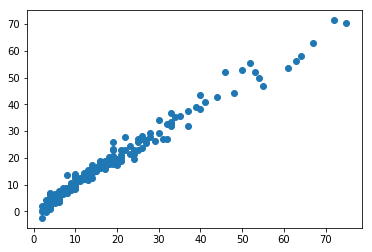

In [44]:
plt.scatter(y_test,predictions)

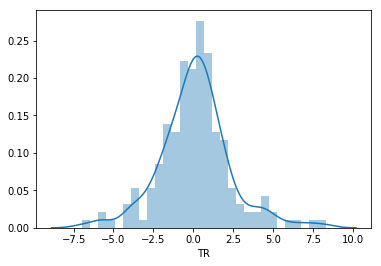

In [45]:
#CHECK IF THE NORMAL DISTRIBUTION IS OK

sns.distplot((y_test-predictions), bins = 30 );

# Result Metrics 

In [46]:
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 1.6102010841459025
MSE: 5.032953787932966
RMSE: 2.2434245670253694


# Modeling PCA

In [47]:
# PCA Visualization
from sklearn.preprocessing import StandardScaler

In [48]:
scaler = StandardScaler()
scaler.fit(dfc)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [49]:
scaled_data = scaler.transform(dfc)

In [50]:
from sklearn.decomposition import PCA

In [51]:
pca = PCA(n_components=5)

In [52]:
pca.fit(scaled_data)

PCA(copy=True, iterated_power='auto', n_components=5, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [53]:
# Now we can transform this data to its first NUM principal components.

x_pca = pca.transform(scaled_data)

In [54]:
scaled_data.shape

(737, 23)

In [55]:
x_pca.shape

(737, 5)

Text(0,0.5,'Second Principal Component')

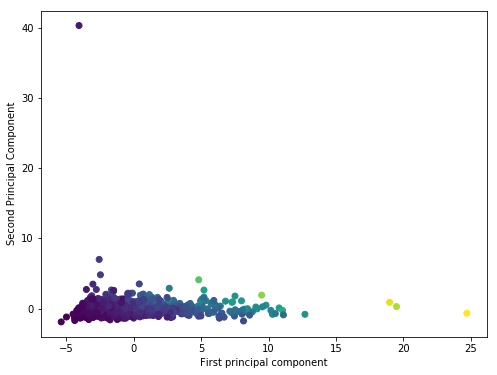

In [56]:
plt.figure(figsize=(8,6))
plt.scatter(x_pca[:,0],x_pca[:,1],c=dfc['TR'],cmap='viridis')
plt.xlabel('First principal component')
plt.ylabel('Second Principal Component')

In [57]:
pca.components_

array([[ 7.59244741e-02,  2.47071354e-01,  2.61029758e-01,
         2.93250907e-01,  2.81409935e-01,  2.93324702e-01,
         3.39313524e-03,  2.52864229e-02,  2.88909849e-01,
         1.36095312e-02,  2.79654550e-01,  2.67387764e-01,
        -3.30657064e-03,  1.11516494e-01, -2.68479292e-02,
         1.98543769e-02,  2.81685068e-01,  2.37357117e-01,
         2.91626730e-01,  2.74920132e-01,  2.63687319e-01,
         1.91932553e-02,  6.81021231e-03],
       [ 1.32964159e-01, -4.95942164e-02, -4.79431713e-02,
        -5.18546173e-02, -5.91141826e-02, -5.12278248e-02,
         8.55525296e-02,  5.60081519e-01, -3.06065055e-03,
         5.67850799e-01, -8.48235442e-03,  1.04773978e-01,
         5.34766497e-01,  6.96616670e-02,  6.06966867e-02,
         2.88040302e-02, -3.13484873e-02, -2.34891408e-02,
        -5.10121895e-02,  2.80279105e-02,  1.17684819e-01,
         1.08019928e-02, -5.95106208e-04],
       [-2.33151386e-01,  1.68887649e-01,  7.53239003e-02,
         4.50445359e-02,  4.3

In [58]:
# Interpreting the components

df_comp = pd.DataFrame(pca.components_,columns=dfc.columns)

In [59]:
df_comp.head()

,DMS,Visitas,Rebotes,Salidas,Usuarios nuevos,Sesiones,VMP,CR,UNC,VS,NVPRC,TR,PCOD,PCRD,Ingresos,CTRLP,CLP,SB,SE,NPP,Cantidad,CRED,CPAY
0,0.075924,0.247071,0.261030,0.293251,0.281410,0.293325,0.003393,0.025286,0.288910,0.013610,0.279655,0.267388,-0.003307,0.111516,-0.026848,0.019854,0.281685,0.237357,0.291627,0.274920,0.263687,0.019193,0.006810
1,0.132964,-0.049594,-0.047943,-0.051855,-0.059114,-0.051228,0.085553,0.560082,-0.003061,0.567851,-0.008482,0.104774,0.534766,0.069662,0.060697,0.028804,-0.031348,-0.023489,-0.051012,0.028028,0.117685,0.010802,-0.000595
2,-0.233151,0.168888,0.075324,0.045045,0.043042,0.044638,0.139555,0.009118,-0.017645,0.049722,-0.049902,0.009732,0.026603,-0.179983,0.017546,-0.405293,-0.078949,-0.182100,0.040403,-0.015399,0.017540,0.583238,0.548847
3,-0.494076,0.111591,0.136482,0.075318,0.087847,0.075023,0.038768,0.021266,-0.068427,0.099100,-0.073107,-0.024480,0.174901,-0.452922,-0.284525,-0.333882,-0.041259,0.152406,0.064695,-0.105243,-0.023800,-0.280296,-0.368652
4,0.109239,0.022107,-0.052952,-0.089440,-0.129304,-0.089647,0.693858,-0.094660,0.083811,0.000693,0.067852,-0.011534,-0.108468,0.372224,-0.305378,-0.349959,-0.130592,0.013132,-0.092433,0.160355,0.094933,-0.100209,-0.115221


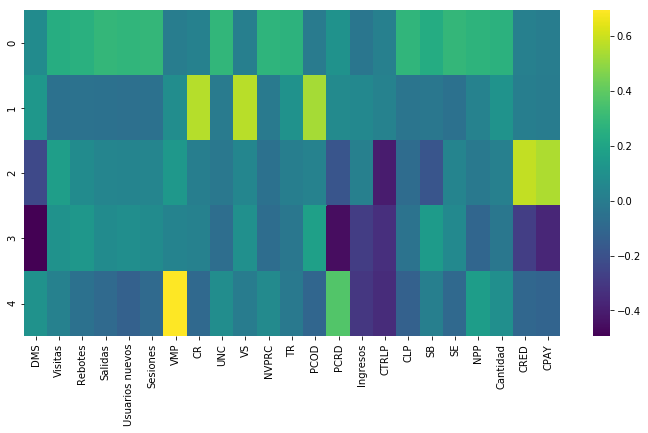

In [60]:
plt.figure(figsize=(12,6))
sns.heatmap(df_comp,cmap='viridis',)

# Three key metrics impacting on number of transactions 

1. Valor medio de pedido
2. Valor por sesion
3. Porcentaje compra/detalle